# Laboratorio 6 - Modsim
## Parte 4
Tiene la tarea de modelar el flujo de tráfico urbano a múltiples escalas, desde vehículos individuales hasta toda la ciudad. Implemente un modelo de flujo de tráfico multiescala en Python para analizar el comportamiento del tráfico y los patrones de congestión.

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import random
from PIL import Image
from IPython.display import display, Image as IPImage

In [9]:
class TrafficSign:
    def __init__(self, x, y, sign_type):
        self.position = np.array([x, y])
        self.sign_type = sign_type

In [10]:
class Vehicle:
    def __init__(self, x, y, speed, direction):
        self.position = np.array([x, y])
        self.velocity = np.array([speed, 0])
        self.acceleration = np.array([0, 0])
        self.direction = direction

    def update(self, vehicles, traffic_signs):
        # ----------------------------------------- REGLA 1 -----------------------------------------
        #                                acelerar al limite de velocidad
        #                                   y frenar prudentemente.
        # -------------------------------------------------------------------------------------------

        target_speed = 60
        max_acceleration = 2 

        speed_error = target_speed - np.linalg.norm(self.velocity)
        if speed_error > 0:
            acceleration = max_acceleration
        else:
            acceleration = -max_acceleration

        # ----------------------------------------- REGLA 2 -----------------------------------------
        #                                     no chocarse con otros
        #                                        y frenar suave.
        # -------------------------------------------------------------------------------------------
        safe_distance = 10 
        for other_vehicle in vehicles:
            if other_vehicle != self:
                distance = np.linalg.norm(other_vehicle.position - self.position)
                if distance < safe_distance:
                    acceleration -= max_acceleration / 2

        
        # ----------------------------------------- REGLA 3 -----------------------------------------
        #                                cambiar carriles prudentemente
        # -------------------------------------------------------------------------------------------
        safe_lane_change_distance = 20
        for other_vehicle in vehicles:
            if other_vehicle != self:
                relative_position = other_vehicle.position - self.position
                if 0 < relative_position[0] < safe_lane_change_distance and abs(relative_position[1]) < 2:
                    # Distancia segura y carril adyacente libre
                    self.position[1] = other_vehicle.position[1]


        # ----------------------------------------- REGLA 4 -----------------------------------------
        #                                señales de transito en la ciudad
        # -------------------------------------------------------------------------------------------
        for sign in traffic_signs:
            distance_to_sign = np.linalg.norm(sign.position - self.position)
            if distance_to_sign < 100:
                if sign.sign_type == "yield":
                    self.velocity[0] *= 0.8  # Reducción del 20% de la velocidad
                elif sign.sign_type == "u-turn":
                    self.direction = "backward" if self.direction == "straight" else "straight"
                elif sign.sign_type == "left-only":
                    self.direction = "left"
                elif sign.sign_type == "right-only":
                    self.direction = "right"




        # ----------------------------------------- RETORNO -----------------------------------------

        if self.direction == "backward":
            self.velocity[0] -= acceleration
            self.position += self.velocity
        elif self.direction == "straight":
            self.velocity[0] += acceleration
            self.position += self.velocity
        elif self.direction == "left":
            self.velocity[1] += acceleration
            self.velocity[0] = 0
            self.position += self.velocity
        elif self.direction == "right":
            self.velocity[1] -= acceleration
            self.velocity[0] = 0
            self.position += self.velocity
        

In [11]:
def generate_random_traffic_signs(num_signs, limx, limy):
    traffic_signs = []
    for _ in range(num_signs):
        x = random.uniform(0, limx)
        y = random.uniform(0, limy)
        sign_type = random.choice(["yield", "u-turn", "left-only", "right-only"])  # Tipo de señal aleatorio
        traffic_signs.append(TrafficSign(x, y, sign_type))
    return traffic_signs

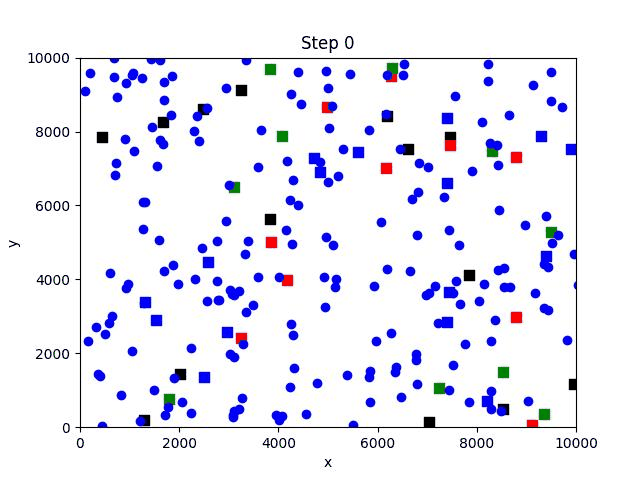

In [12]:
limx=10000
limy=10000

num_vehicles = 200
vehicles = [Vehicle(random.uniform(0, limx), random.uniform(0, limy), random.uniform(20, 80), random.choice(["straight", "backward", "left", "right"])) for _ in range(num_vehicles)]

num_traffic_signs = 50
traffic_signs = generate_random_traffic_signs(num_traffic_signs, limx, limy)

list_images = []
num_steps = 100
for step in range(num_steps):
    plt.clf()
    plt.xlim(0, limx)
    plt.ylim(0, limy)

    x=[]
    y=[]

    for vehicle in vehicles:
        vehicle.update(vehicles, traffic_signs)
        x.append(vehicle.position[0])
        y.append(vehicle.position[1])
    
    
    for sign in traffic_signs:
        sign_type = sign.sign_type
        if sign_type == "yield":
            color = "red"
        elif sign_type == "u-turn":
            color = "blue"
        elif sign_type == "left-only":
            color = "green"
        elif sign_type == "right-only":
            color = "black"
        else:
            color = "black"  # Color predeterminado para tipos desconocidos

        plt.scatter(sign.position[0], sign.position[1], c=color, marker='s', s=50)

    
    plt.plot(x, y, "bo")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("Step " + str(step))
    name =  f"./E4_images/step_{step}.jpg"
    plt.savefig(name, format="jpg")
    plt.close()
    list_images.append(name)

images = [Image.open(path) for path in list_images]
gif_path = f"./E4_gifs/animation.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], loop=0, duration=100)
display(IPImage(filename=gif_path))


### ¿Qué es el modelado multiescala y por qué es valioso para comprender el flujo y la congestión del tráfico urbano?
El modelo multiescala es para poder evaluar y determinar patrones de comportamiento de agentes y entornos a diferentes escalas. Y esto es valioso para poder comprender el flujo y congestión de tráfico urbano pues nos permite tener la interacción de N cantidad de agentes tipo vehiculo que simulan las reglas básicas del comportamiento de un auto en el tráfico urbano. Con esto podemos comprender como se comportan grandes aglomeraciones de vehiculos haciendo alta densidad vehicular y como se comportan las otras zonas donde el tránsito es regulado y normal.


### Describe el modelo individual a nivel de vehículo en esta simulación multiescala. ¿Qué parámetros y factores se consideran a esta escala?
Se le da incialmente una cantidad definida de agentes tipo vehiculo y tipo señal de transito. Estos son generados con una posicion randomizada dentro de un canvas con tamaño definido previamente. Luego a los vehiculos se les estableció una velocidad y aceleración inicial establecida como común entre todos los agentes. Estos cuentan con una dirección de movimiento lo cual permite que los vehiculos estan avanzando en el canvas de la simulación en formas arriba, abajo, derecha e izquierda. Estos cuentan con detección tanto de otros vehiculos que hacen que disminuyan la velocidad al acercarse a estos, o detectar las señales de transito y ya sea disminuir velocidad o cambiar su dirección. Los vehiculos siempre buscarán llegar a la velocidad ideal de 60km/h pero por regla definida estos no podrán pasar de esta velocidad una vez lleguen a la misma. 



### Explique el modelo a nivel de segmento de carretera. ¿Cómo tiene en cuenta la densidad del tráfico, los límites de velocidad y la congestión?
Esto es simplemente tomar una carretera y simular esta en un bloque de canvas donde se ingresen las señales de transito correspondientes y la velocidad limite correspondiente. Luego se le da un comportamiento a los vehiculos de no colisionar y respetar las señales. Posterior a esto podremos ver la velocidad a la cual transitan los vehiculos en la simulación de carretera y podremos ver cuales son los puntos donde hay más congestión.



### Analice el modelo a nivel de intersección. ¿Qué variables se tienen en cuenta al simular las interacciones de vehículos en las intersecciones?
Para poder realizar una intersección se debe de tomar en cuenta los posibles semaforos en la misma o señales de transito que den una prioridad a una calle o avenida que se encuentra en la intersección. Luego de tener estos pues se le da a los carros una distancia segura y se les da un comportamiento de giro y demás dependiendo del carril donde estén transitando. Esto ayudará a dictar en qué dirección deben de girar los vehiculos al estar en la intersección. Finalmente en el semaforo se debe de dar una caracteristica para priorizar que calle o avenida lleva la vía y darle un tiempo definido para permitir el paso de la contra parte.
